In [23]:
import torch
import torch.nn.functional as F
from torch.utils.data import Dataset
import pytorch_lightning as pl
import segmentation_models_pytorch as smp
from datasets import load_dataset
from torch.utils.data import random_split
from torchvision.transforms import v2
from collections import defaultdict
import pandas as pd
import matplotlib.pyplot as plt
import os
import random
import numpy as np
import cv2
import glob
from PIL import Image
from scipy.ndimage import distance_transform_edt


In [24]:
ds = load_dataset("urbanstevie/reference_dataset")


Repo card metadata block was not found. Setting CardData to empty.


In [25]:
from utilities import set_seed
set_seed(42)

42

## Sprinkles method got from:
[Here](https://github.com/jcgy/sprinkles)

In [26]:
def sprinkles(
    img,
    size,
    perc,
    channels=3,
    mode="random",
    width=2,
    pattern_path="fence_pattern.png",
    mask_dataset_path="dataset/Training Set/Training_Labels",
    dilation_kernel_size=3,
    background_weight=0.1,
    normalize_weights=True,
):
    """
    img: torch.Tensor of shape (C, H, W), values in [0, 1]
    mode: "random" | "grid" | "diagonals" | "pattern" | "dataset_mask"
    size:
        - random: sprinkle square size
        - grid/diagonals: spacing between lines
        - pattern/dataset_mask: ignored
    perc:
        - random: percentage of pixels to affect
        - grid/diagonals/pattern/dataset_mask: ignored (kept for API consistency)
    width: line thickness for grid/diagonals
    pattern_path: path to the fence pattern image (for mode="pattern")
    mask_dataset_path: path to the mask dataset folder (for mode="dataset_mask")
    dilation_kernel_size: kernel size for morphological dilation (for mode="dataset_mask")
    """
    x = img.clone()
    C, H, W = x.shape
    mask = torch.zeros((1, H, W), dtype=torch.float32)
    
    # RANDOM (original behavior)
    if mode == "random":
        number_of_pixels_to_change = int(perc * H * W)
        number_of_sprinkles = max(1, number_of_pixels_to_change // (size * size))
        for _ in range(number_of_sprinkles):
            y = torch.randint(0, H - size, (1,)).item()
            x0 = torch.randint(0, W - size, (1,)).item()
            x[:, y:y + size, x0:x0 + size] = 0.0
            mask[:, y:y + size, x0:x0 + size] = 1.0
    
    # GRID (vertical + horizontal lines)
    elif mode == "grid":
        for y in range(0, H, size):
            y_end = min(y + width, H)
            x[:, y:y_end, :] = 0.0
            mask[:, y:y_end, :] = 1.0
        for x0 in range(0, W, size):
            x_end = min(x0 + width, W)
            x[:, :, x0:x_end] = 0.0
            mask[:, :, x0:x_end] = 1.0
    
    # DIAGONALS (both directions)
    elif mode == "diagonals":
        for offset in range(-H, W, size):
            for w in range(width):
                # main diagonal \
                y = torch.arange(H)
                x_diag = y + offset + w
                valid = (x_diag >= 0) & (x_diag < W)
                x[:, y[valid], x_diag[valid]] = 0.0
                mask[:, y[valid], x_diag[valid]] = 1.0
                # anti-diagonal /
                x_anti = (W - 1 - y) + offset + w
                valid = (x_anti >= 0) & (x_anti < W)
                x[:, y[valid], x_anti[valid]] = 0.0
                mask[:, y[valid], x_anti[valid]] = 1.0
    
    # PATTERN (load from image file)
    elif mode == "pattern":
        # Load the pattern image
        if not os.path.exists(pattern_path):
            raise FileNotFoundError(f"Pattern image not found: {pattern_path}")
        
        pattern_img = Image.open(pattern_path).convert("L")  # Convert to grayscale
        pattern_img = pattern_img.resize((W, H), Image.NEAREST)  # Resize to match image
        
        # Convert to tensor and normalize
        pattern_array = np.array(pattern_img, dtype=np.float32) / 255.0
        pattern_tensor = torch.from_numpy(pattern_array).unsqueeze(0)  # [1, H, W]
        
        # Binarize the pattern (threshold at 0.5)
        mask = (pattern_tensor > 0.5).float()
        
        # Apply mask to image (zero out where mask is 1)
        x = x * (1 - mask)
    
    # DATASET_MASK (load random mask from dataset)
    elif mode == "dataset_mask":
        # Get all mask files from the dataset
        if not os.path.exists(mask_dataset_path):
            raise FileNotFoundError(f"Mask dataset path not found: {mask_dataset_path}")
        
        mask_files = glob.glob(os.path.join(mask_dataset_path, "*.png")) + \
                     glob.glob(os.path.join(mask_dataset_path, "*.jpg")) + \
                     glob.glob(os.path.join(mask_dataset_path, "*.jpeg"))
        
        if len(mask_files) == 0:
            raise FileNotFoundError(f"No mask images found in: {mask_dataset_path}")
        
        # Randomly select a mask file
        random_mask_path = np.random.choice(mask_files)
        
        # Load the mask image
        mask_img = Image.open(random_mask_path).convert("L")  # Convert to grayscale
        mask_array = np.array(mask_img, dtype=np.float32) / 255.0
        
        # Get mask dimensions
        mask_h, mask_w = mask_array.shape
        
        # Strategy: Random crop or resize based on relative sizes
        
        mask_img_resized = mask_img.resize((W, H), Image.BILINEAR)
        mask_array = np.array(mask_img_resized, dtype=np.float32) / 255.0
        
        # Apply dilation to thicken the mask lines
        if dilation_kernel_size > 0:
            kernel = cv2.getStructuringElement(
                cv2.MORPH_ELLIPSE, 
                (dilation_kernel_size, dilation_kernel_size)
            )
            mask_array = cv2.dilate(mask_array, kernel, iterations=1)
        
        # Convert to tensor
        mask_tensor = torch.from_numpy(mask_array).unsqueeze(0)  # [1, H, W]
        
        # Binarize the mask (threshold at 0.5)
        mask = (mask_tensor > 0.5).float()
        
        # Apply mask to image (zero out where mask is 1)
        x = x * (1 - mask)
    
    else:
        raise ValueError(f"Unknown mode: {mode}")
        
    weights = torch.full((1, H, W), background_weight, dtype=torch.float32)
    mask_np = mask[0].numpy().astype(bool)
    
    if mask_np.any():  # Solo si hay áreas afectadas
        # Distance transform: calcula distancia al borde más cercano
        # Para las áreas enmascaradas (True), da valores más altos en el centro
        distances = distance_transform_edt(mask_np)
        distances = torch.from_numpy(distances).float().unsqueeze(0)
        
        # Normalizar distancias si se requiere
        if normalize_weights and distances.max() > 0:
            distances = distances / distances.max()
        
        # Aplicar las distancias solo donde hay mask
        weights = torch.where(mask > 0, distances, weights)

    
    return x, img, mask, weights

In [27]:
from torchvision.transforms import v2

# Transformaciones de Augmentation
# Nota: Aplicamos Resize y CenterCrop aquí para que sprinkles trabaje sobre el tamaño final
train_aug = v2.Compose([
    v2.ToImage(),
    v2.Resize(256),
    v2.CenterCrop(224),
    v2.RandomHorizontalFlip(p=0.5),
    v2.RandomRotation(degrees=10),
    v2.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.1),
    v2.RandomApply([v2.GaussianBlur(kernel_size=5)], p=0.3),
    v2.ToDtype(torch.float32, scale=True),
    v2.Normalize(
        mean=[0.34437724, 0.38029198, 0.40777111], 
        std=[0.20265734, 0.13689059, 0.11554374]
    )
])

# Para validación/test NO usamos augmentation aleatorio, solo el preprocesamiento base
test_transforms = v2.Compose([
    v2.ToImage(),
    v2.Resize(256),
    v2.CenterCrop(224),
    v2.ToDtype(torch.float32, scale=True),
    v2.Normalize(
        mean=[0.34437724, 0.38029198, 0.40777111], 
        std=[0.20265734, 0.13689059, 0.11554374]
    )
])

In [28]:
class HFImageDataset(Dataset):
    def __init__(self, hf_dataset, transforms=None, sprinkles_mode='random',
                 mask_dataset_path="dataset/Training Set/Training_Labels",
                 dilation_kernel_size=3):
        self.dataset = hf_dataset
        self.transforms = transforms
        self.sprinkles_mode = sprinkles_mode
        self.mask_dataset_path = mask_dataset_path
        self.dilation_kernel_size = dilation_kernel_size
    
    def __len__(self):
        return len(self.dataset)
    
    def __getitem__(self, idx):
        item = self.dataset[idx]
        image = item['image']  # PIL Image
        
        if self.transforms:
            image = self.transforms(image)
        
        # Create masked version
        masked_image, original_image, mask, weights = sprinkles(
            image, 
            size=10, 
            perc=0.15, 
            mode=self.sprinkles_mode,
            mask_dataset_path=self.mask_dataset_path,
            dilation_kernel_size=self.dilation_kernel_size
        )
        
        return {
            'masked_image': masked_image,  # X - input to U-Net
            'original_image': original_image,  # Y - target for U-Net
            'mask': mask,  # Optional: can be used for masked loss
            'weights': weights
        }


# DataModule
class DataModule(pl.LightningDataModule):
    def __init__(self, dataset_name, bs, train_split=0.70, val_split=0.15, 
                 test_split=0.15, num_workers=4, sprinkles_mode='random',
                 mask_dataset_path="dataset/Training Set/Training_Labels",
                 dilation_kernel_size=3):
        super().__init__()
        self.dataset_name = dataset_name
        self.bs = bs
        self.train_split = train_split
        self.val_split = val_split
        self.test_split = test_split
        self.num_workers = num_workers
        self.sprinkles_mode = sprinkles_mode
        self.mask_dataset_path = mask_dataset_path
        self.dilation_kernel_size = dilation_kernel_size
    
    def setup(self, stage=None):
        # Load dataset
        ds = load_dataset(self.dataset_name)
        
        # If dataset has splits, use them
        if 'train' in ds and 'test' in ds:
            full_train = ds['train']
            self.test_data = ds['test']
            
            # Split train into train/val
            train_size = int(self.train_split / (self.train_split + self.val_split) * len(full_train))
            val_size = len(full_train) - train_size
            train_data, val_data = random_split(full_train, [train_size, val_size])
            
        else:
            # No predefined splits, create our own
            full_dataset = ds['train'] if 'train' in ds else ds[list(ds.keys())[0]]
            total_size = len(full_dataset)
            train_size = int(self.train_split * total_size)
            val_size = int(self.val_split * total_size)
            test_size = total_size - train_size - val_size
            
            train_data, val_data, test_data = random_split(
                full_dataset, 
                [train_size, val_size, test_size]
            )
            self.test_data = test_data
        
        # Define transforms
        rgb_transforms = v2.Compose([
            v2.ToImage(), 
            v2.Resize(256),
            v2.CenterCrop(224),
            v2.ToDtype(torch.float32, scale=True),
            v2.Normalize(
                mean=[0.34437724, 0.38029198, 0.40777111], 
                std=[0.20265734, 0.13689059, 0.11554374]
            )
        ])
        
        # Create datasets with cutouts
        self.train_ds = HFImageDataset(
            train_data, 
            transforms=train_aug, # <--- CON Augmentation
            sprinkles_mode=self.sprinkles_mode
        )
        self.valid_ds = HFImageDataset(
            val_data, 
            transforms=test_transforms, # <--- SIN Augmentation (limpio)
            sprinkles_mode=self.sprinkles_mode
        )
        self.test_ds = HFImageDataset(
            test_data, 
            transforms=test_transforms, 
            sprinkles_mode=self.sprinkles_mode
        )
    
    def train_dataloader(self):
        return torch.utils.data.DataLoader(
            self.train_ds, 
            batch_size=self.bs, 
            shuffle=True, 
            num_workers=self.num_workers
        )
    
    def val_dataloader(self):
        return torch.utils.data.DataLoader(
            self.valid_ds, 
            batch_size=self.bs, 
            shuffle=False, 
            num_workers=self.num_workers
        )
    
    def test_dataloader(self):
        return torch.utils.data.DataLoader(
            self.test_ds, 
            batch_size=self.bs, 
            shuffle=False, 
            num_workers=self.num_workers
        )

Repo card metadata block was not found. Setting CardData to empty.


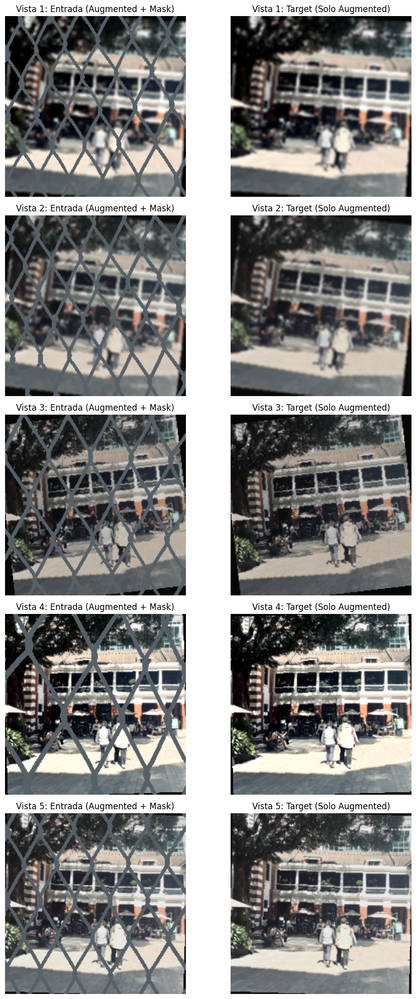

In [29]:
def visualize_augmentations(dataset, idx=0, num_views=5):
    mean = torch.tensor([0.34437724, 0.38029198, 0.40777111]).view(3, 1, 1)
    std = torch.tensor([0.20265734, 0.13689059, 0.11554374]).view(3, 1, 1)
    
    fig, axes = plt.subplots(num_views, 2, figsize=(10, 4*num_views))
    
    for i in range(num_views):
        # Al llamar al __getitem__, se aplican transformaciones aleatorias distintas cada vez
        sample = dataset[idx]
        
        masked_img = sample['masked_image'] * std + mean
        original_img = sample['original_image'] * std + mean
        
        axes[i, 0].imshow(torch.clamp(masked_img, 0, 1).permute(1, 2, 0).numpy())
        axes[i, 0].set_title(f"Vista {i+1}: Entrada (Augmented + Mask)")
        axes[i, 0].axis('off')
        
        axes[i, 1].imshow(torch.clamp(original_img, 0, 1).permute(1, 2, 0).numpy())
        axes[i, 1].set_title(f"Vista {i+1}: Target (Solo Augmented)")
        axes[i, 1].axis('off')

    plt.tight_layout()
    plt.show()

# Ejecución
dm_aug = DataModule(dataset_name="urbanstevie/reference_dataset", bs=32, sprinkles_mode="dataset_mask")
dm_aug.setup()
visualize_augmentations(dm_aug.train_ds)

In [30]:
import torch
import torch.nn.functional as F
import pytorch_lightning as pl
import segmentation_models_pytorch as smp
from collections import defaultdict

class LightningModule(pl.LightningModule):
    def __init__(self, learning_rate=1e-3, use_weighted_loss=True):
        super().__init__()
        self.save_hyperparameters()
        
        # El modelo recibe 4 canales: RGB (3) + Máscara (1)
        # Salida: RGB (3)
        self.model = smp.Unet(
            encoder_name='resnet50',
            encoder_weights='imagenet',
            in_channels=4, 
            classes=3,
            activation=None # Salida lineal para reconstrucción de píxeles normalizados
        )
        
        # Diccionarios para acumular métricas por época
        self.training_step_outputs = defaultdict(float)
        self.validation_step_outputs = defaultdict(float)
        
    def forward(self, x):
        # x shape esperado: [B, 4, H, W]
        return self.model(x)
    
    def _shared_step(self, batch):
        """Procesamiento común para train y val"""
        x_img = batch['masked_image']   # [B, 3, H, W]
        y_target = batch['original_image'] # [B, 3, H, W]
        mask = batch['mask']            # [B, 1, H, W]
        weights = batch['weights']      # [B, 1, H, W]
        
        # Asegurar que máscara y pesos tengan dimensión de canal
        if mask.dim() == 3: mask = mask.unsqueeze(1)
        if weights.dim() == 3: weights = weights.unsqueeze(1)
        
        # CONCATENACIÓN CRÍTICA: Imagen + Máscara = 4 canales
        x_input = torch.cat([x_img, mask], dim=1)
        
        # Predicción
        y_hat = self(x_input)
        
        # Cálculo de Loss
        loss_per_pixel = F.l1_loss(y_hat, y_target, reduction='none')
        
        if self.hparams.use_weighted_loss:
            # Los pesos del distance transform dan más importancia al centro de la valla
            weights_expanded = weights.expand_as(loss_per_pixel)
            loss = (loss_per_pixel * weights_expanded).sum() / (weights_expanded.sum() + 1e-8)
        else:
            # Loss estándar solo en los píxeles de la máscara
            loss = (loss_per_pixel * mask).sum() / (mask.sum() + 1e-8)
            
        return loss

    def training_step(self, batch, batch_idx):
        loss = self._shared_step(batch)
        
        self.log('train_loss', loss, on_step=False, on_epoch=True, prog_bar=True)
        self.training_step_outputs['loss'] += loss.detach().cpu()
        self.training_step_outputs['steps'] += 1
        return loss
    
    def validation_step(self, batch, batch_idx):
        loss = self._shared_step(batch)
        
        self.log('val_loss', loss, on_step=False, on_epoch=True, prog_bar=True)
        self.validation_step_outputs['loss'] += loss.detach().cpu()
        self.validation_step_outputs['steps'] += 1
        return loss

    def on_train_epoch_end(self): 
        if self.training_step_outputs['steps'] > 0:
            avg_loss = self.training_step_outputs['loss'] / self.training_step_outputs['steps']
            print(f"Epoch {self.current_epoch} - Avg Train Loss: {avg_loss.item():.4f}")
        self.training_step_outputs.clear() 

    def on_validation_epoch_end(self):
        if self.validation_step_outputs['steps'] > 0:
            avg_loss = self.validation_step_outputs['loss'] / self.validation_step_outputs['steps']
            print(f"Epoch {self.current_epoch} - Avg Val Loss: {avg_loss.item():.4f}")
        self.validation_step_outputs.clear()

    def configure_optimizers(self):
        optimizer = torch.optim.Adam(self.parameters(), lr=self.hparams.learning_rate)
        
        # Scheduler para reducir el LR si el loss se estanca
        scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
            optimizer, 
            mode='min',
            factor=0.5,
            patience=5,
            min_lr=1e-6
        )
        
        return {
            "optimizer": optimizer,
            "lr_scheduler": {
                "scheduler": scheduler,
                "monitor": "val_loss"
            }
        }

In [31]:
import pytorch_lightning as pl
from pytorch_lightning.callbacks import EarlyStopping, ModelCheckpoint, LearningRateMonitor
from pytorch_lightning.loggers import CSVLogger

# Initialize model
lightning_module = LightningModule(learning_rate=1e-3)

# Logger
csv_logger = CSVLogger(
    save_dir=os.getcwd(), 
    name=f"data_augmentation"
)

# Checkpoint callback - save best model
model_checkpoint_callback = ModelCheckpoint(
    monitor='val_loss', 
    mode='min', 
    filename='best_valid_loss-{epoch:02d}-{val_loss:.4f}', 
    verbose=True, 
    save_top_k=3,  # Keep top 3 models
    save_last=True  # Also save last model
)

# Early stopping callback
early_stop_callback = EarlyStopping(
    monitor='val_loss',
    min_delta=0.001,      # Minimum change to qualify as improvement
    patience=7,           # Stop after 7 epochs without improvement
    verbose=True,
    mode='min',
    strict=True,          # Crash if monitor metric not found
    check_finite=True     # Stop if loss becomes NaN/Inf
)

# Learning rate monitor
lr_monitor = LearningRateMonitor(logging_interval='epoch')

# Trainer
trainer = pl.Trainer(
    max_epochs=50,       # Allow longer training
    logger=csv_logger, 
    callbacks=[
        model_checkpoint_callback,
        early_stop_callback,
        lr_monitor
    ],
    gradient_clip_val=1.0,  # Prevent exploding gradients
    log_every_n_steps=5,
    enable_progress_bar=True,
    enable_model_summary=True
)

# Data module
dm = DataModule(
    dataset_name="urbanstevie/reference_dataset", 
    bs=32,
    sprinkles_mode="dataset_mask",
    mask_dataset_path="dataset/Training Set/Training_Labels",
    dilation_kernel_size=5
)
dm.setup()

# Train
trainer.fit(lightning_module, dm)

print(f"\n✓ Training completed!")
print(f"  Best model saved to: {model_checkpoint_callback.best_model_path}")
print(f"  Best validation loss: {model_checkpoint_callback.best_model_score:.4f}")

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
Repo card metadata block was not found. Setting CardData to empty.
Repo card metadata block was not found. Setting CardData to empty.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name  | Type | Params | Mode 
---------------------------------------
0 | model | Unet | 32.5 M | train
---------------------------------------
32.5 M    Trainable params
0         Non-trainable params
32.5 M    Total params
130.098   Total estimated model params size (MB)
223       Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Epoch 0 - Avg Val Loss: 1.5292


Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved. New best score: 0.916
Epoch 0, global step 115: 'val_loss' reached 0.91593 (best 0.91593), saving model to '/home/alumno/Desktop/datos/Computer Vision/Final-Computer-Vision/data_augmentation/version_1/checkpoints/best_valid_loss-epoch=00-val_loss=0.9159.ckpt' as top 3


Epoch 0 - Avg Val Loss: 0.9081
Epoch 0 - Avg Train Loss: 0.5205


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.521 >= min_delta = 0.001. New best score: 0.395
Epoch 1, global step 230: 'val_loss' reached 0.39496 (best 0.39496), saving model to '/home/alumno/Desktop/datos/Computer Vision/Final-Computer-Vision/data_augmentation/version_1/checkpoints/best_valid_loss-epoch=01-val_loss=0.3950.ckpt' as top 3


Epoch 1 - Avg Val Loss: 0.3953
Epoch 1 - Avg Train Loss: 0.3804


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 2, global step 345: 'val_loss' reached 0.41467 (best 0.39496), saving model to '/home/alumno/Desktop/datos/Computer Vision/Final-Computer-Vision/data_augmentation/version_1/checkpoints/best_valid_loss-epoch=02-val_loss=0.4147.ckpt' as top 3


Epoch 2 - Avg Val Loss: 0.4147
Epoch 2 - Avg Train Loss: 0.3501


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.068 >= min_delta = 0.001. New best score: 0.327
Epoch 3, global step 460: 'val_loss' reached 0.32666 (best 0.32666), saving model to '/home/alumno/Desktop/datos/Computer Vision/Final-Computer-Vision/data_augmentation/version_1/checkpoints/best_valid_loss-epoch=03-val_loss=0.3267.ckpt' as top 3


Epoch 3 - Avg Val Loss: 0.3268
Epoch 3 - Avg Train Loss: 0.3296


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.033 >= min_delta = 0.001. New best score: 0.294
Epoch 4, global step 575: 'val_loss' reached 0.29377 (best 0.29377), saving model to '/home/alumno/Desktop/datos/Computer Vision/Final-Computer-Vision/data_augmentation/version_1/checkpoints/best_valid_loss-epoch=04-val_loss=0.2938.ckpt' as top 3


Epoch 4 - Avg Val Loss: 0.2939
Epoch 4 - Avg Train Loss: 0.3209


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 5, global step 690: 'val_loss' reached 0.32126 (best 0.29377), saving model to '/home/alumno/Desktop/datos/Computer Vision/Final-Computer-Vision/data_augmentation/version_1/checkpoints/best_valid_loss-epoch=05-val_loss=0.3213.ckpt' as top 3


Epoch 5 - Avg Val Loss: 0.3215
Epoch 5 - Avg Train Loss: 0.3114


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.008 >= min_delta = 0.001. New best score: 0.286
Epoch 6, global step 805: 'val_loss' reached 0.28554 (best 0.28554), saving model to '/home/alumno/Desktop/datos/Computer Vision/Final-Computer-Vision/data_augmentation/version_1/checkpoints/best_valid_loss-epoch=06-val_loss=0.2855.ckpt' as top 3


Epoch 6 - Avg Val Loss: 0.2858
Epoch 6 - Avg Train Loss: 0.3098


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 7, global step 920: 'val_loss' reached 0.28998 (best 0.28554), saving model to '/home/alumno/Desktop/datos/Computer Vision/Final-Computer-Vision/data_augmentation/version_1/checkpoints/best_valid_loss-epoch=07-val_loss=0.2900.ckpt' as top 3


Epoch 7 - Avg Val Loss: 0.2903
Epoch 7 - Avg Train Loss: 0.3010


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 8, global step 1035: 'val_loss' was not in top 3


Epoch 8 - Avg Val Loss: 0.3195
Epoch 8 - Avg Train Loss: 0.2961


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 9, global step 1150: 'val_loss' reached 0.28680 (best 0.28554), saving model to '/home/alumno/Desktop/datos/Computer Vision/Final-Computer-Vision/data_augmentation/version_1/checkpoints/best_valid_loss-epoch=09-val_loss=0.2868.ckpt' as top 3


Epoch 9 - Avg Val Loss: 0.2868
Epoch 9 - Avg Train Loss: 0.2936


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 10, global step 1265: 'val_loss' was not in top 3


Epoch 10 - Avg Val Loss: 0.3018
Epoch 10 - Avg Train Loss: 0.2921


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.011 >= min_delta = 0.001. New best score: 0.274
Epoch 11, global step 1380: 'val_loss' reached 0.27413 (best 0.27413), saving model to '/home/alumno/Desktop/datos/Computer Vision/Final-Computer-Vision/data_augmentation/version_1/checkpoints/best_valid_loss-epoch=11-val_loss=0.2741.ckpt' as top 3


Epoch 11 - Avg Val Loss: 0.2741
Epoch 11 - Avg Train Loss: 0.2846


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 12, global step 1495: 'val_loss' reached 0.28126 (best 0.27413), saving model to '/home/alumno/Desktop/datos/Computer Vision/Final-Computer-Vision/data_augmentation/version_1/checkpoints/best_valid_loss-epoch=12-val_loss=0.2813.ckpt' as top 3


Epoch 12 - Avg Val Loss: 0.2815
Epoch 12 - Avg Train Loss: 0.2823


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 13, global step 1610: 'val_loss' was not in top 3


Epoch 13 - Avg Val Loss: 0.2859
Epoch 13 - Avg Train Loss: 0.2784


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.005 >= min_delta = 0.001. New best score: 0.269
Epoch 14, global step 1725: 'val_loss' reached 0.26946 (best 0.26946), saving model to '/home/alumno/Desktop/datos/Computer Vision/Final-Computer-Vision/data_augmentation/version_1/checkpoints/best_valid_loss-epoch=14-val_loss=0.2695.ckpt' as top 3


Epoch 14 - Avg Val Loss: 0.2695
Epoch 14 - Avg Train Loss: 0.2843


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.004 >= min_delta = 0.001. New best score: 0.266
Epoch 15, global step 1840: 'val_loss' reached 0.26591 (best 0.26591), saving model to '/home/alumno/Desktop/datos/Computer Vision/Final-Computer-Vision/data_augmentation/version_1/checkpoints/best_valid_loss-epoch=15-val_loss=0.2659.ckpt' as top 3


Epoch 15 - Avg Val Loss: 0.2660
Epoch 15 - Avg Train Loss: 0.2789


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.013 >= min_delta = 0.001. New best score: 0.253
Epoch 16, global step 1955: 'val_loss' reached 0.25325 (best 0.25325), saving model to '/home/alumno/Desktop/datos/Computer Vision/Final-Computer-Vision/data_augmentation/version_1/checkpoints/best_valid_loss-epoch=16-val_loss=0.2532.ckpt' as top 3


Epoch 16 - Avg Val Loss: 0.2533
Epoch 16 - Avg Train Loss: 0.2763


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 17, global step 2070: 'val_loss' was not in top 3


Epoch 17 - Avg Val Loss: 0.2785
Epoch 17 - Avg Train Loss: 0.2675


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 18, global step 2185: 'val_loss' reached 0.26494 (best 0.25325), saving model to '/home/alumno/Desktop/datos/Computer Vision/Final-Computer-Vision/data_augmentation/version_1/checkpoints/best_valid_loss-epoch=18-val_loss=0.2649.ckpt' as top 3


Epoch 18 - Avg Val Loss: 0.2651
Epoch 18 - Avg Train Loss: 0.2742


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 19, global step 2300: 'val_loss' was not in top 3


Epoch 19 - Avg Val Loss: 0.3174
Epoch 19 - Avg Train Loss: 0.2748


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 20, global step 2415: 'val_loss' was not in top 3


Epoch 20 - Avg Val Loss: 0.2835
Epoch 20 - Avg Train Loss: 0.2741


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 21, global step 2530: 'val_loss' reached 0.25764 (best 0.25325), saving model to '/home/alumno/Desktop/datos/Computer Vision/Final-Computer-Vision/data_augmentation/version_1/checkpoints/best_valid_loss-epoch=21-val_loss=0.2576.ckpt' as top 3


Epoch 21 - Avg Val Loss: 0.2577
Epoch 21 - Avg Train Loss: 0.2718


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.002 >= min_delta = 0.001. New best score: 0.251
Epoch 22, global step 2645: 'val_loss' reached 0.25133 (best 0.25133), saving model to '/home/alumno/Desktop/datos/Computer Vision/Final-Computer-Vision/data_augmentation/version_1/checkpoints/best_valid_loss-epoch=22-val_loss=0.2513.ckpt' as top 3


Epoch 22 - Avg Val Loss: 0.2515
Epoch 22 - Avg Train Loss: 0.2679


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 23, global step 2760: 'val_loss' was not in top 3


Epoch 23 - Avg Val Loss: 0.2728
Epoch 23 - Avg Train Loss: 0.2724


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.005 >= min_delta = 0.001. New best score: 0.246
Epoch 24, global step 2875: 'val_loss' reached 0.24642 (best 0.24642), saving model to '/home/alumno/Desktop/datos/Computer Vision/Final-Computer-Vision/data_augmentation/version_1/checkpoints/best_valid_loss-epoch=24-val_loss=0.2464.ckpt' as top 3


Epoch 24 - Avg Val Loss: 0.2466
Epoch 24 - Avg Train Loss: 0.2619


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.001 >= min_delta = 0.001. New best score: 0.245
Epoch 25, global step 2990: 'val_loss' reached 0.24516 (best 0.24516), saving model to '/home/alumno/Desktop/datos/Computer Vision/Final-Computer-Vision/data_augmentation/version_1/checkpoints/best_valid_loss-epoch=25-val_loss=0.2452.ckpt' as top 3


Epoch 25 - Avg Val Loss: 0.2454
Epoch 25 - Avg Train Loss: 0.2598


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 26, global step 3105: 'val_loss' was not in top 3


Epoch 26 - Avg Val Loss: 0.2857
Epoch 26 - Avg Train Loss: 0.2685


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 27, global step 3220: 'val_loss' was not in top 3


Epoch 27 - Avg Val Loss: 0.2542
Epoch 27 - Avg Train Loss: 0.2651


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 28, global step 3335: 'val_loss' was not in top 3


Epoch 28 - Avg Val Loss: 0.2579
Epoch 28 - Avg Train Loss: 0.2565


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 29, global step 3450: 'val_loss' was not in top 3


Epoch 29 - Avg Val Loss: 0.2576
Epoch 29 - Avg Train Loss: 0.2593


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.001 >= min_delta = 0.001. New best score: 0.244
Epoch 30, global step 3565: 'val_loss' reached 0.24415 (best 0.24415), saving model to '/home/alumno/Desktop/datos/Computer Vision/Final-Computer-Vision/data_augmentation/version_1/checkpoints/best_valid_loss-epoch=30-val_loss=0.2442.ckpt' as top 3


Epoch 30 - Avg Val Loss: 0.2442
Epoch 30 - Avg Train Loss: 0.2612


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 31, global step 3680: 'val_loss' was not in top 3


Epoch 31 - Avg Val Loss: 0.2477
Epoch 31 - Avg Train Loss: 0.2572


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.009 >= min_delta = 0.001. New best score: 0.235
Epoch 32, global step 3795: 'val_loss' reached 0.23541 (best 0.23541), saving model to '/home/alumno/Desktop/datos/Computer Vision/Final-Computer-Vision/data_augmentation/version_1/checkpoints/best_valid_loss-epoch=32-val_loss=0.2354.ckpt' as top 3


Epoch 32 - Avg Val Loss: 0.2358
Epoch 32 - Avg Train Loss: 0.2561


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 33, global step 3910: 'val_loss' was not in top 3


Epoch 33 - Avg Val Loss: 0.2614
Epoch 33 - Avg Train Loss: 0.2589


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 34, global step 4025: 'val_loss' was not in top 3


Epoch 34 - Avg Val Loss: 0.2790
Epoch 34 - Avg Train Loss: 0.2483


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 35, global step 4140: 'val_loss' was not in top 3


Epoch 35 - Avg Val Loss: 0.2560
Epoch 35 - Avg Train Loss: 0.2503


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 36, global step 4255: 'val_loss' was not in top 3


Epoch 36 - Avg Val Loss: 0.2475
Epoch 36 - Avg Train Loss: 0.2516


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 37, global step 4370: 'val_loss' was not in top 3


Epoch 37 - Avg Val Loss: 0.2471
Epoch 37 - Avg Train Loss: 0.2488


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 38, global step 4485: 'val_loss' was not in top 3


Epoch 38 - Avg Val Loss: 0.2631
Epoch 38 - Avg Train Loss: 0.2461


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.006 >= min_delta = 0.001. New best score: 0.230
Epoch 39, global step 4600: 'val_loss' reached 0.22990 (best 0.22990), saving model to '/home/alumno/Desktop/datos/Computer Vision/Final-Computer-Vision/data_augmentation/version_1/checkpoints/best_valid_loss-epoch=39-val_loss=0.2299.ckpt' as top 3


Epoch 39 - Avg Val Loss: 0.2300
Epoch 39 - Avg Train Loss: 0.2415


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.004 >= min_delta = 0.001. New best score: 0.226
Epoch 40, global step 4715: 'val_loss' reached 0.22597 (best 0.22597), saving model to '/home/alumno/Desktop/datos/Computer Vision/Final-Computer-Vision/data_augmentation/version_1/checkpoints/best_valid_loss-epoch=40-val_loss=0.2260.ckpt' as top 3


Epoch 40 - Avg Val Loss: 0.2261
Epoch 40 - Avg Train Loss: 0.2429


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 41, global step 4830: 'val_loss' was not in top 3


Epoch 41 - Avg Val Loss: 0.2905
Epoch 41 - Avg Train Loss: 0.2377


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 42, global step 4945: 'val_loss' reached 0.23341 (best 0.22597), saving model to '/home/alumno/Desktop/datos/Computer Vision/Final-Computer-Vision/data_augmentation/version_1/checkpoints/best_valid_loss-epoch=42-val_loss=0.2334.ckpt' as top 3


Epoch 42 - Avg Val Loss: 0.2336
Epoch 42 - Avg Train Loss: 0.2334


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 43, global step 5060: 'val_loss' reached 0.22782 (best 0.22597), saving model to '/home/alumno/Desktop/datos/Computer Vision/Final-Computer-Vision/data_augmentation/version_1/checkpoints/best_valid_loss-epoch=43-val_loss=0.2278.ckpt' as top 3


Epoch 43 - Avg Val Loss: 0.2278
Epoch 43 - Avg Train Loss: 0.2316


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 44, global step 5175: 'val_loss' was not in top 3


Epoch 44 - Avg Val Loss: 0.2354
Epoch 44 - Avg Train Loss: 0.2394


Validation: |          | 0/? [00:00<?, ?it/s]

Metric val_loss improved by 0.004 >= min_delta = 0.001. New best score: 0.221
Epoch 45, global step 5290: 'val_loss' reached 0.22149 (best 0.22149), saving model to '/home/alumno/Desktop/datos/Computer Vision/Final-Computer-Vision/data_augmentation/version_1/checkpoints/best_valid_loss-epoch=45-val_loss=0.2215.ckpt' as top 3


Epoch 45 - Avg Val Loss: 0.2219
Epoch 45 - Avg Train Loss: 0.2281


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 46, global step 5405: 'val_loss' reached 0.22442 (best 0.22149), saving model to '/home/alumno/Desktop/datos/Computer Vision/Final-Computer-Vision/data_augmentation/version_1/checkpoints/best_valid_loss-epoch=46-val_loss=0.2244.ckpt' as top 3


Epoch 46 - Avg Val Loss: 0.2246
Epoch 46 - Avg Train Loss: 0.2272


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 47, global step 5520: 'val_loss' was not in top 3


Epoch 47 - Avg Val Loss: 0.2314
Epoch 47 - Avg Train Loss: 0.2271


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 48, global step 5635: 'val_loss' reached 0.22251 (best 0.22149), saving model to '/home/alumno/Desktop/datos/Computer Vision/Final-Computer-Vision/data_augmentation/version_1/checkpoints/best_valid_loss-epoch=48-val_loss=0.2225.ckpt' as top 3


Epoch 48 - Avg Val Loss: 0.2224
Epoch 48 - Avg Train Loss: 0.2294


Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 49, global step 5750: 'val_loss' was not in top 3


Epoch 49 - Avg Val Loss: 0.2339
Epoch 49 - Avg Train Loss: 0.2257


`Trainer.fit` stopped: `max_epochs=50` reached.



✓ Training completed!
  Best model saved to: /home/alumno/Desktop/datos/Computer Vision/Final-Computer-Vision/data_augmentation/version_1/checkpoints/best_valid_loss-epoch=45-val_loss=0.2215.ckpt
  Best validation loss: 0.2215


   epoch  lr-Adam  step  train_loss  val_loss
0    0.0      NaN   114    0.520612  0.915932
1    1.0      NaN   229    0.379276  0.394963
2    2.0      NaN   344    0.349659  0.414669
3    3.0      NaN   459    0.327718  0.326662
4    4.0      NaN   574    0.319552  0.293774


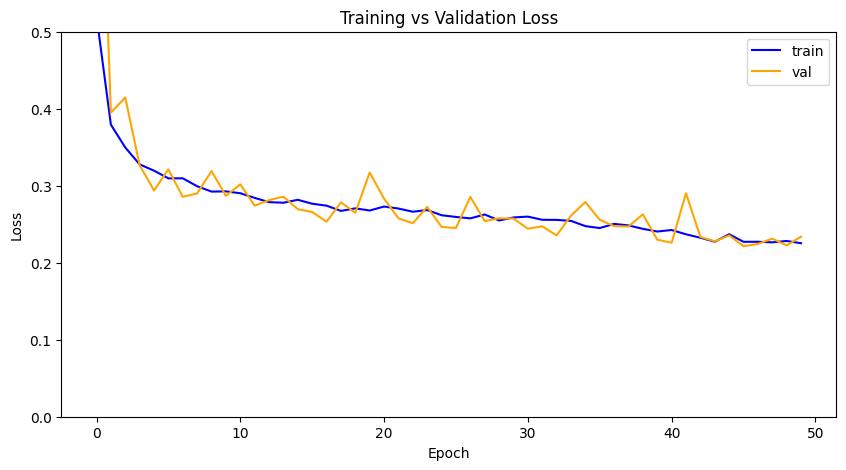

In [33]:
metric_df = pd.read_csv('data_augmentation/version_1/metrics.csv')
metric_df = metric_df.groupby('epoch', as_index=False).first()
print(metric_df.head())

f, ax = plt.subplots(1, 1, figsize=(10, 5))
metric_df.train_loss.plot(ax=ax, color='blue', label='train')
metric_df.val_loss.plot(ax=ax, color='orange', label='val')

ax.set_xlabel('Epoch')
ax.set_ylabel('Loss')
ax.set_ylim([0,0.5]) 
ax.set_title('Training vs Validation Loss')
ax.legend()
plt.show()



In [34]:
# Load the best model
model = LightningModule.load_from_checkpoint(model_checkpoint_callback.best_model_path)
model.cuda(0) # Move to GPU
model.eval()

LightningModule(
  (model): Unet(
    (encoder): ResNetEncoder(
      (conv1): Conv2d(4, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (relu): ReL

In [43]:
def denormalize(img, mean, std):
    """Denormalize image for visualization"""
    img = img.clone()
    for i in range(3):
        img[i] = img[i] * std[i] + mean[i]
    return img.clamp(0, 1)

def visualize_inpainting(model, dataloader, device='cuda', num_images=4):
    """
    Visualize inpainting results
    
    Args:
        model: Trained PyTorch Lightning model
        dataloader: DataLoader with test/validation data
        device: 'cuda' or 'cpu'
        num_images: Number of images to visualize
    """
    model.eval()
    model.to(device)
    
    # Get normalization parameters (adjust these to match your DataModule)
    mean = [0.34437724, 0.38029198, 0.40777111]
    std = [0.20265734, 0.13689059, 0.11554374]
    
    # Get a batch
    batch = next(iter(dataloader))
    masked_images = batch['masked_image'][:num_images].to(device)
    original_images = batch['original_image'][:num_images].to(device)
    masks = batch['mask'][:num_images].to(device)
    
    # Ensure mask has channel dimension
    if masks.dim() == 3:
        masks = masks.unsqueeze(1)  # [B, H, W] -> [B, 1, H, W]
    
    # Concatenate masked images with mask to create 4-channel input
    input_images = torch.cat([masked_images, masks], dim=1)  # [B, 4, H, W]
    
    # Get predictions
    with torch.no_grad():
        predicted_images = model(input_images)
    
    # Move to CPU for visualization
    masked_images = masked_images.cpu()
    original_images = original_images.cpu()
    predicted_images = predicted_images.cpu()
    masks = masks.cpu()
    
    # Create figure with 5 columns
    fig, axes = plt.subplots(num_images, 5, figsize=(20, 4*num_images))
    
    for i in range(num_images):
        # Denormalize images
        masked_img = denormalize(masked_images[i], mean, std)
        original_img = denormalize(original_images[i], mean, std)
        predicted_img = denormalize(predicted_images[i], mean, std)
        
        # Calculate absolute difference (error map)
        diff = torch.abs(predicted_img - original_img)
        # Convert to grayscale for difference visualization (mean across RGB channels)
        diff_gray = diff.mean(dim=0).numpy()
        
        # Convert to numpy for plotting (C, H, W) -> (H, W, C)
        masked_np = masked_img.permute(1, 2, 0).numpy()
        original_np = original_img.permute(1, 2, 0).numpy()
        predicted_np = predicted_img.permute(1, 2, 0).numpy()
        mask_np = masks[i, 0].numpy()  # Single channel mask
        
        # Plot
        axes[i, 0].imshow(masked_np)
        axes[i, 0].set_title('Masked Input', fontsize=12, fontweight='bold')
        axes[i, 0].axis('off')
        
        axes[i, 1].imshow(mask_np, cmap='gray')
        axes[i, 1].set_title('Mask', fontsize=12, fontweight='bold')
        axes[i, 1].axis('off')
        
        axes[i, 2].imshow(predicted_np)
        axes[i, 2].set_title('Predicted/Reconstructed', fontsize=12, fontweight='bold')
        axes[i, 2].axis('off')
        
        axes[i, 3].imshow(original_np)
        axes[i, 3].set_title('Original/Target', fontsize=12, fontweight='bold')
        axes[i, 3].axis('off')
        
        # Difference map with color gradient
        im = axes[i, 4].imshow(diff_gray, cmap='coolwarm', vmin=0, vmax=1)
        axes[i, 4].set_title('Difference Map', fontsize=12, fontweight='bold')
        axes[i, 4].axis('off')
        
        # Add colorbar to the last row
        if i == num_images - 1:
            cbar = plt.colorbar(im, ax=axes[i, 4], fraction=0.046, pad=0.04)
            cbar.set_label('Error Magnitude', rotation=270, labelpad=15)
    
    plt.tight_layout()
    plt.savefig('inpainting_results.png', dpi=150, bbox_inches='tight')
    plt.show()
    
    print(f"Results saved to 'inpainting_results.png'")


Visualizing results for: DATA_AUGMENTATION mode



Repo card metadata block was not found. Setting CardData to empty.


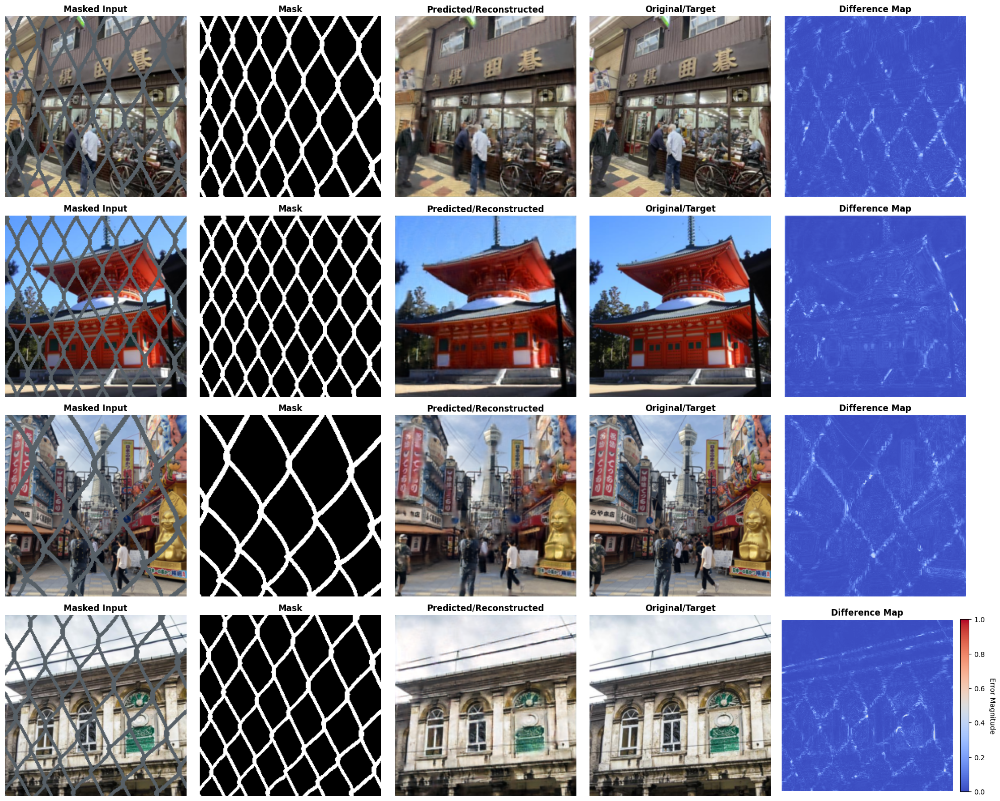

Results saved to 'inpainting_results.png'
✓ Completed visualization for data_augmentation mode

All visualizations complete!


In [37]:
import torch

sprinkle_modes = ["data_augmentation"]
device = 'cuda' if torch.cuda.is_available() else 'cpu'

for mode in sprinkle_modes:
    print(f"\n{'='*60}")
    print(f"Visualizing results for: {mode.upper()} mode")
    print(f"{'='*60}\n")
    
    # Load model checkpoint for this mode
    checkpoint_path = f'{mode}/version_1/checkpoints/best_valid_loss-epoch=48-val_loss=0.2225.ckpt'
    model = LightningModule.load_from_checkpoint(checkpoint_path)
    
    # Load data with the same sprinkle mode used for training
    data_module = DataModule(
        dataset_name='urbanstevie/reference_dataset', 
        bs=64,
        sprinkles_mode="dataset_mask"
    )
    data_module.setup()
    
    # Visualize results
    visualize_inpainting(
        model=model,
        dataloader=data_module.test_dataloader(),
        device=device,
        num_images=4
    )
    
    print(f"✓ Completed visualization for {mode} mode\n")

print(f"{'='*60}")
print("All visualizations complete!")
print(f"{'='*60}")

In [40]:
from torch.utils.data import Dataset, DataLoader
class SegmentationDataset(Dataset):
    def __init__(self, images_dir, labels_dir, spatial_transforms=None, image_transforms=None):
        self.images_dir = images_dir
        self.labels_dir = labels_dir
        self.spatial_transforms = spatial_transforms
        self.image_transforms = image_transforms
        # Listar archivos
        self.image_files = sorted(
            [f for f in os.listdir(images_dir) if f.lower().endswith(".jpg")]
        )
    
    def __len__(self):
        return len(self.image_files)
    
    def __getitem__(self, idx):
        img_name = self.image_files[idx]
        base_name = os.path.splitext(img_name)[0]
        img_path = os.path.join(self.images_dir, img_name)
        label_path = os.path.join(self.labels_dir, base_name + ".png")
        
        # 1. Cargar imagen y máscara
        image = Image.open(img_path).convert("RGB")
        mask = Image.open(label_path).convert("L")
        
        # 2. Aplicar transformaciones espaciales (Resize/Crop) a ambas
        if self.spatial_transforms:
            # v2 maneja la sincronización automáticamente si se pasan juntos
            image, mask = self.spatial_transforms(image, mask)
        
        # 3. Aplicar transformaciones de imagen (Normalize/ToTensor) solo a la imagen
        if self.image_transforms:
            image = self.image_transforms(image)

        # 4. Procesar la máscara para Inpainting
        mask_np = np.array(mask, dtype=np.float32) / 255.0
        
        # Dilatación: Hacemos la valla más "gorda" para que el modelo no vea bordes
        kernel = np.ones((5, 5), np.uint8)
        mask_np = cv2.dilate(mask_np, kernel, iterations=1)
        
        mask_tensor = torch.from_numpy(mask_np).unsqueeze(0) # [1, H, W]
        mask_tensor = (mask_tensor > 0.5).float() # Asegurar binario
        
        # 5. Crear la imagen con "huecos" (masked_image)
        masked_image = image * (1 - mask_tensor)
        
        # 6. Crear pesos neutros para evitar KeyError en el LightningModule
        weights = torch.ones_like(mask_tensor)
        
        return {
            'masked_image': masked_image,  # Entrada RGB con valla negra
            'original_image': image,       # Target original (con valla, para métricas)
            'mask': mask_tensor,           # El 4º canal para el modelo
            'weights': weights             # Pesos planos para compatibilidad
        }

class SegmentationDataModule(pl.LightningDataModule):
    def __init__(self, data_dir, batch_size=16, num_workers=4):
        super().__init__()
        self.data_dir = data_dir
        self.batch_size = batch_size
        self.num_workers = num_workers
        
        # Transformaciones espaciales idénticas al entrenamiento
        self.spatial_transforms = v2.Compose([
            v2.Resize(256),
            v2.CenterCrop(224),
        ])

        # Normalización idéntica al entrenamiento
        self.image_transforms = v2.Compose([
            v2.ToImage(),
            v2.ToDtype(torch.float32, scale=True),
            v2.Normalize(
                mean=[0.34437724, 0.38029198, 0.40777111],
                std=[0.20265734, 0.13689059, 0.11554374]
            )
        ])

    def setup(self, stage=None):
        self.train_dataset = SegmentationDataset(
            images_dir=os.path.join(self.data_dir, "Training Set", "Training_Images"),
            labels_dir=os.path.join(self.data_dir, "Training Set", "Training_Labels"),
            spatial_transforms=self.spatial_transforms,
            image_transforms=self.image_transforms,
        )
        self.test_dataset = SegmentationDataset(
            images_dir=os.path.join(self.data_dir, "Test Set", "Test_Images"),
            labels_dir=os.path.join(self.data_dir, "Test Set", "Test_Labels"),
            spatial_transforms=self.spatial_transforms,
            image_transforms=self.image_transforms,
        )
    
    def train_dataloader(self):
        return DataLoader(self.train_dataset, batch_size=self.batch_size, shuffle=True, num_workers=self.num_workers)
    
    def test_dataloader(self):
        return DataLoader(self.test_dataset, batch_size=self.batch_size, shuffle=False, num_workers=self.num_workers)

In [45]:
def visualize_inpainting(model, dataloader, device='cuda', num_images=4):
    model.eval()
    model.to(device)
    
    mean = [0.34437724, 0.38029198, 0.40777111]
    std = [0.20265734, 0.13689059, 0.11554374]
    
    batch = next(iter(dataloader))
    masked_images = batch['masked_image'][:num_images].to(device)
    original_images = batch['original_image'][:num_images].to(device) # Este es el fondo real
    masks = batch['mask'][:num_images].to(device)
    
    if masks.dim() == 3:
        masks = masks.unsqueeze(1)
    
    # 4-channel input
    input_images = torch.cat([masked_images, masks], dim=1)
    
    with torch.no_grad():
        predicted_images = model(input_images)
    
    # --- LÓGICA DE RELLENO EXCLUSIVO ---
    # Combinamos: (Imagen Original donde NO hay valla) + (Predicción donde SÍ hay valla)
    composed_images = original_images * (1 - masks) + predicted_images * masks
    # ----------------------------------

    # Mover a CPU
    original_images = original_images.cpu()
    composed_images = composed_images.cpu()
    masks = masks.cpu()
    
    fig, axes = plt.subplots(num_images, 3, figsize=(15, 4*num_images))
    if num_images == 1: axes = axes.reshape(1, -1)

    for i in range(num_images):
        original_img = denormalize(original_images[i], mean, std)
        composed_img = denormalize(composed_images[i], mean, std)
        
        # 1. Entrada original con la valla
        axes[i, 0].imshow(original_img.permute(1, 2, 0).numpy())
        axes[i, 0].set_title('Original (Con valla)')
        axes[i, 0].axis('off')
        
        # 2. Máscara de lo que vamos a cambiar
        axes[i, 1].imshow(masks[i, 0].numpy(), cmap='gray')
        axes[i, 1].set_title('Zona a Rellenar')
        axes[i, 1].axis('off')
        
        # 3. Resultado Final (Solo se ha cambiado lo blanco de la máscara)
        axes[i, 2].imshow(composed_img.permute(1, 2, 0).numpy())
        axes[i, 2].set_title('Resultado (Solo Máscara Rellenada)')
        axes[i, 2].axis('off')
    
    plt.tight_layout()
    plt.show()

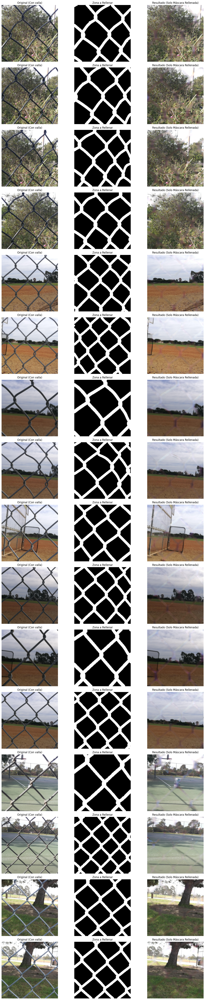

In [46]:
# Load the diagonals checkpoint
checkpoint_path = 'data_augmentation/version_1/checkpoints/best_valid_loss-epoch=48-val_loss=0.2225.ckpt'
model = LightningModule.load_from_checkpoint(checkpoint_path)

# Load your segmentation dataset
data_module = SegmentationDataModule(
    data_dir='dataset',
    batch_size=16
)
data_module.setup()

# Visualize results
device = 'cuda' if torch.cuda.is_available() else 'cpu'
visualize_inpainting(
    model=model,
    dataloader=data_module.test_dataloader(),
    device=device,
    num_images=16
)